In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
# import gseapy
import matplotlib.pyplot as plt
import warnings
import os

from sklearn.cluster import KMeans
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from anndata import AnnData
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import anndata as ad
import tifffile as tiff

from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from scipy.stats import gmean

np.random.seed(42)

warnings.simplefilter(action="ignore", category=Warning)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['pdf.fonttype'] = 42  # Ensures text is stored as editable Type 1 fonts
plt.rcParams['ps.fonttype'] = 42   # For EPS compatibility

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 0

sc.settings.set_figure_params(dpi=100)

data_path = '/data/wuqitian/breast'

samples = ['NCBI785', 'NCBI784', 'NCBI783']

def normalize(x):
    return (x - x.min()) / (x.max() - x.min())

def logit(x):
    x = np.clip(x, 1e-15, 1 - 1e-15)
    return np.log(np.divide(x, 1 - x))

def logit_inv(x):
    return 1 / (1 + np.exp(-x))

def get_mode_estimate(data):
    geo_mean = gmean(data, axis=0)
    return geo_mean

In [2]:
import sys
sys.path.append(os.path.abspath("../"))
import torch
from torch_cluster import knn_graph
import encoders
from models.pretrain import Model_Pretrain

device = "cpu"
gene_embeddings = torch.zeros((23258, 256), dtype=torch.float).to(device)
gene_embeddings = gene_embeddings
encoder1 = encoders.Transformer(in_channels=1536, hidden_channels=1024, num_layers_prop=2, num_layers_mlp=2, num_attn_heads=1,
                                        dropout=0., use_bn=True, use_graph=True, use_residual=True).to(device)
encoder2 = encoders.MLP(in_channels=256, hidden_channels=1024, num_layers=1, dropout=0.).to(device)
model_pretrain = Model_Pretrain(encoder1, encoder2, gene_embeddings, reg_w=0.5, ge_trainable=True, ge_pretrained=False).to(device)
    
pretrained_state_dict = torch.load('../../model_checkpoints/ours_pretrain_xenium_lung+.pth')
model_pretrain.load_state_dict(pretrained_state_dict)
model_pretrain.eval()

def get_embs_attns(adata):
    gene_index = adata.var['gene_filtered_idx']
    
    cell_image_emb = adata.obsm['embeddings']
    inputs = torch.tensor(cell_image_emb, dtype=torch.float).to(device)
    cell_by_gene = adata.layers['X_log1p']
    y_ge = torch.tensor(cell_by_gene, dtype=torch.float).to(device)
    
    cell_location = torch.tensor(adata.obsm['centroids'], dtype=torch.float)
    edge_index = knn_graph(cell_location, k=5, loop=False).to(device)
    
    with torch.no_grad():
        image_embs_ours, gene_embs_ours = model_pretrain(inputs, y_ge, gene_index, edge_index)
        image_embs_ours, gene_embs_ours = image_embs_ours.cpu().numpy(), gene_embs_ours.cpu().numpy()
        embs_ours = model_pretrain.encoder1.get_embeddings(inputs, edge_index).cpu().numpy() # [layer num, spot num, hidden size]
        attn_ours = model_pretrain.encoder1.get_attentions(inputs, edge_index).cpu().numpy() # [layer num, spot num, spot num]
    
    print(embs_ours.shape, attn_ours.shape)
    return embs_ours, attn_ours

In [3]:
adata_path = "/ewsc/wuqitian/breast/NCBI785_attn.h5ad"
adata_sample = sc.read(adata_path)
print(adata_sample)

AnnData object with n_obs × n_vars = 100000 × 541
    obs: 'cell_id', 'cell_type'
    var: 'gene_names', 'gene_filter_mask', 'gene_filtered_idx', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'organ', 'species', 'tech'
    obsm: 'attn_layer_0', 'attn_layer_1', 'centroids', 'embeddings'
    layers: 'X_filter_protein', 'X_log1p', 'X_normed'


<tifffile.TiffFile 'NCBI785.tif'> shaped series shape does not match page shape


(-0.5, 30785.5, -0.5, 24240.5)

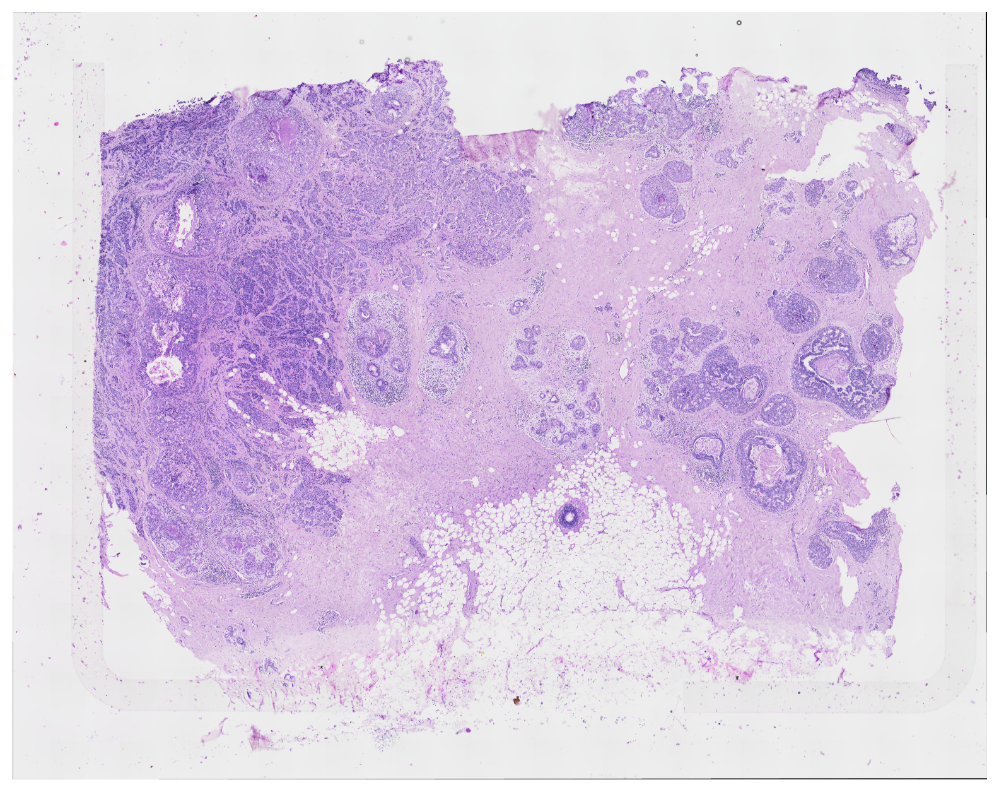

In [4]:
image_path = '/ewsc/wuqitian/hest_data/wsis/NCBI785.tif'
image = tiff.imread(image_path)
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(image)
plt.gca().invert_yaxis()
ax.grid(False)
ax.axis('off')

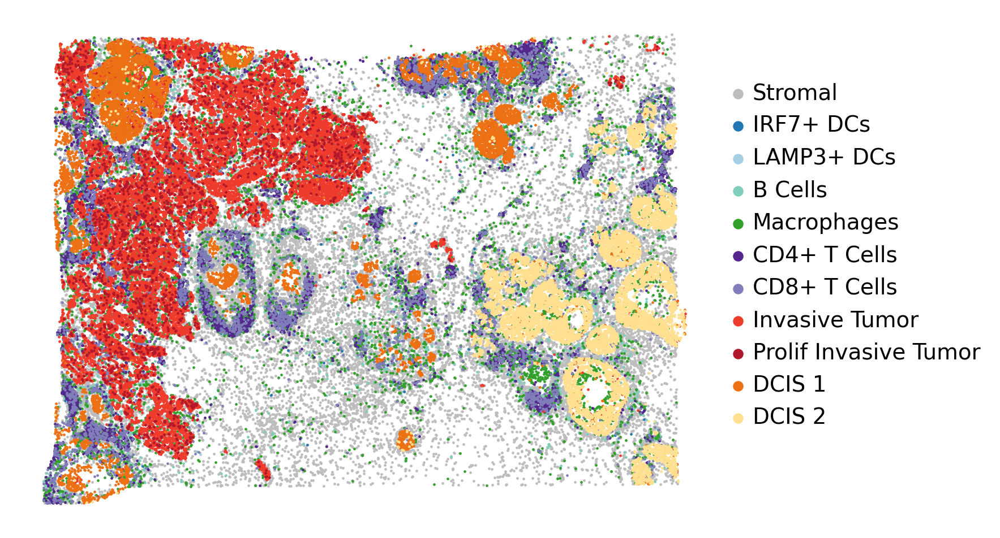

In [5]:
ct_name_map = {'B_Cells': 'B Cells', 'CD4+_T_Cells': 'CD4+ T Cells', 'CD8+_T_Cells': 'CD8+ T Cells', 'DCIS_1': 'DCIS 1', 'DCIS_2': 'DCIS 2', 
 'Endothelial': 'Endothelial', 'IRF7+_DCs': 'IRF7+ DCs', 'LAMP3+_DCs': 'LAMP3+ DCs', 'Invasive_Tumor': 'Invasive Tumor', 'Prolif_Invasive_Tumor': 'Prolif Invasive Tumor',
 'Macrophages_1': 'Macrophages', 'Macrophages_2': 'Macrophages', 'Stromal': 'Stromal',
 'Mast_Cells': 'Mast Cells', 'Myoepi_ACTA2+': 'Myoepithelial', 'Myoepi_KRT15+': 'Myoepithelial'}

centroids = adata_sample.obsm['centroids']
x, y = centroids[:, 0], centroids[:, 1]
filter_mask = adata_sample.obs['cell_type'].isin(ct_name_map.keys())
cell_types = adata_sample[filter_mask].obs['cell_type'].map(ct_name_map).to_numpy()
x, y = x[filter_mask], y[filter_mask]

colors = {'Stromal': '#bdbdbd',
         'IRF7+ DCs': '#1f78b4', 'LAMP3+ DCs': '#a6cee3', 'B Cells': '#7fcdbb',
          'Macrophages': '#33a02c', 'CD4+ T Cells': '#54278f', 'CD8+ T Cells': '#807dba',
          'Invasive Tumor': '#ef3b2c', 'Prolif Invasive Tumor': '#b2182b', 'DCIS 1': '#ec7014', 'DCIS 2': '#fee090'} 

fig, ax = plt.subplots(figsize=(8, 6))

for ct in colors.keys():
    mask = cell_types==ct
    ax.scatter(x[mask], y[mask], s=0.5, c=colors[ct], label=ct)
ax.legend(loc='upper right', bbox_to_anchor=(1.4, 0.9), markerscale=8, ncols=1, fontsize=14, frameon=False)
plt.grid(False)
plt.axis('off')

plt.show()

In [6]:
attn_matrix = adata_sample.obsm['attn_layer_0'] + 1

filter_mask = adata_sample.obs['cell_type'].isin(ct_name_map.keys())
adata_sample = adata_sample[filter_mask]

cell_types = adata_sample.obs['cell_type'].map(ct_name_map).to_numpy()

filter_mask = filter_mask.to_numpy()
attn_matrix_plot = attn_matrix[filter_mask]
attn_matrix_plot = attn_matrix_plot[:, filter_mask]

centroids = adata_sample.obsm['centroids']
x, y = centroids[:, 0], centroids[:, 1]

[[0.708 0.359 0.396 0.567 0.526 0.461]
 [0.627 0.356 0.244 0.521 0.531 0.381]
 [0.659 0.584 0.571 0.868 0.612 0.519]
 [0.631 0.415 0.289 0.743 0.587 0.571]]


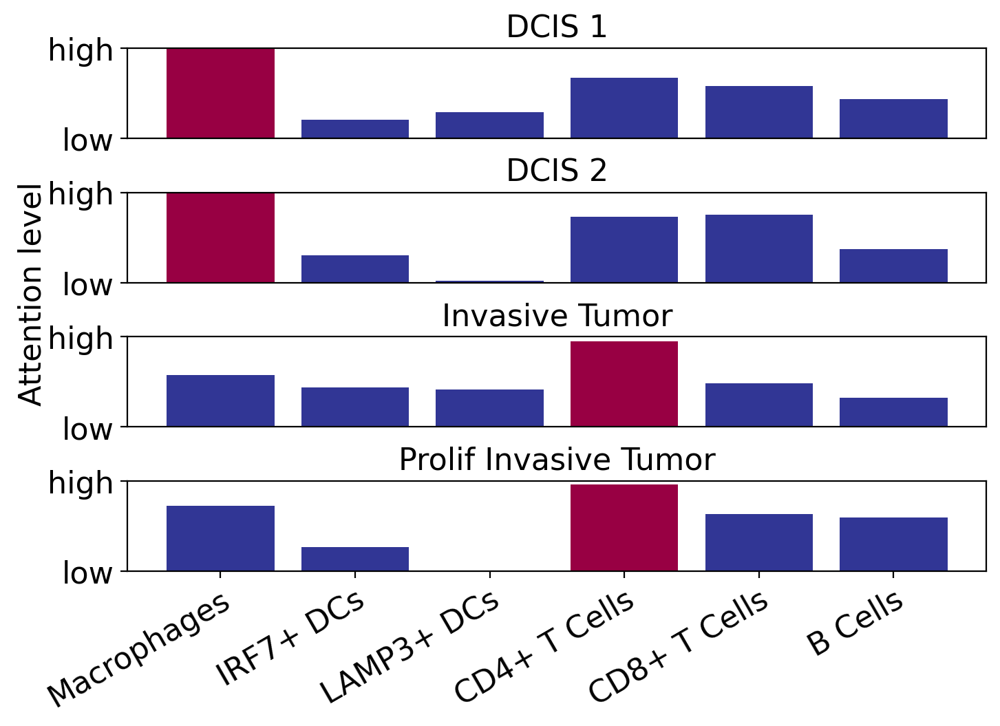

In [80]:
import matplotlib.cm as cm

ct_query = ['DCIS 1', 'DCIS 2', 'Invasive Tumor', 'Prolif Invasive Tumor']
ct_key = ['Macrophages', 'IRF7+ DCs', 'LAMP3+ DCs', 'CD4+ T Cells', 'CD8+ T Cells', 'B Cells']

attn_avg_matrix = [
    [0.708, 0.359, 0.396, 0.567, 0.526, 0.461],
    [0.627, 0.356, 0.244, 0.521, 0.531, 0.381],
    [0.659, 0.584, 0.571, 0.868, 0.612, 0.519],
    [0.631, 0.415, 0.289, 0.743, 0.587, 0.571],
]

attn_avg_matrix = np.array(attn_avg_matrix)

attn_avg_matrix = attn_avg_matrix / attn_avg_matrix.sum(axis=1, keepdims=True)
attn_avg_matrix = (attn_avg_matrix - np.min(attn_avg_matrix)) / (np.max(attn_avg_matrix) - np.min(attn_avg_matrix))
                                                                 
fig, axes = plt.subplots(4, 1, figsize=(8, 5), gridspec_kw={'hspace': 0.6})
axes = axes.flatten() 

for i in range(attn_avg_matrix.shape[0]):
    ax = axes[i]
    scores = attn_avg_matrix[i]
    colors = ['#980043' if j==np.argmax(scores) else '#313695' for j in range(scores.shape[0])]
    ax.bar(ct_key, scores, color=colors)
    ax.set_title(f"{ct_query[i]}", fontsize=16)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.set_ylabel(" ")
    ax.set_ylim(0, 1)
    ax.set_yticks([0, 1])
    ax.set_yticklabels(["low", "high"])
    ax.grid(False)
    if i==3:
        ax.set_xticklabels(ct_key, rotation=30, ha="right", rotation_mode="anchor")
        ax.tick_params(axis='both', which='both', top=False, right=False)
    else:
        ax.tick_params(axis='both', which='both', bottom=False, top=False, right=False, labelbottom=False) 
        
fig.text(0.08, 0.4, 'Attention level', fontsize=16, rotation=90)

plt.tight_layout()
plt.savefig('../../figure/attn_analysis_breast_ct_avg.pdf', dpi=100)

plt.show()
    

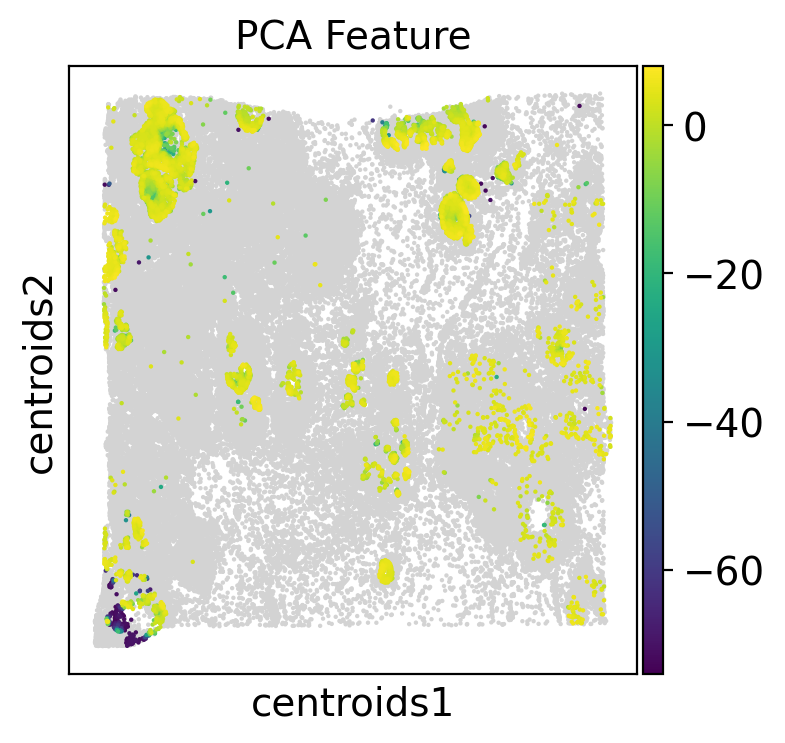

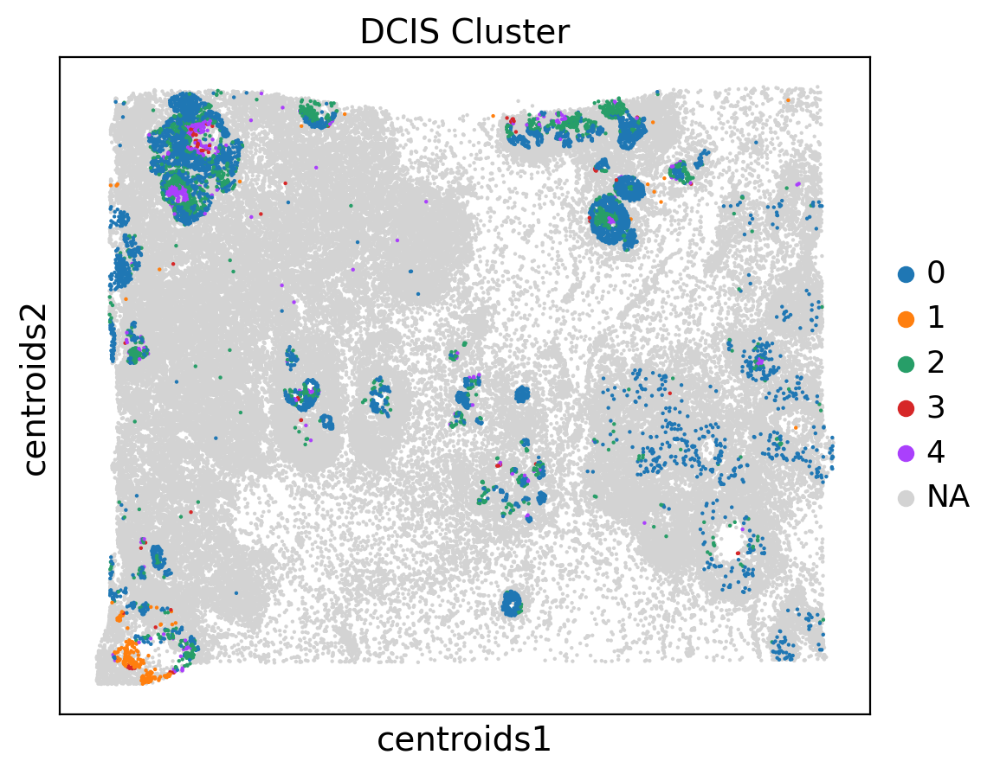

In [10]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

idx = np.arange(cell_types.shape[0])
ct_query = ['DCIS 1']
ct_key = ['Macrophages'] 

mask_query = np.zeros((idx.shape[0], ), dtype=bool)
for ct in ct_query:
    mask_query += (cell_types==ct)
mask_key = np.zeros((idx.shape[0], ), dtype=bool)
for ct in ct_key:
    mask_key += (cell_types==ct)
attn_sub = attn_matrix_plot[mask_query]
attn_sub = attn_sub[:, mask_key]

k = 5
n_pca = 100
n_pca_use = 10

pca = PCA(n_components=n_pca)
attn_pca = pca.fit_transform(attn_sub)
kmeans = KMeans(n_clusters=k, random_state=42)
dcis_clusters = kmeans.fit_predict(attn_pca[:, :n_pca_use])
dcis_clusters = dcis_clusters.astype(str)

adata_sample.obs['pca_feature'] = np.nan
adata_sample.obs.loc[mask_query, 'pca_feature'] = attn_pca[:, 0]
sc.pl.embedding(adata_sample, basis='centroids', color='pca_feature', title="PCA Feature", s=10)

adata_sample.obs['dcis_cluster'] = np.nan
adata_sample.obs.loc[mask_query, 'dcis_cluster'] = dcis_clusters
sc.settings.set_figure_params(dpi=100, figsize=(6, 5))
sc.pl.embedding(adata_sample, basis='centroids', color='dcis_cluster', title="DCIS Cluster", s=10)

# np.save('/data/wuqitian/breast/NCBI785_dcis1_cluster.npy', dcis_clusters)
# np.save('/data/wuqitian/breast/NCBI785_dcis2_cluster.npy', dcis_clusters)

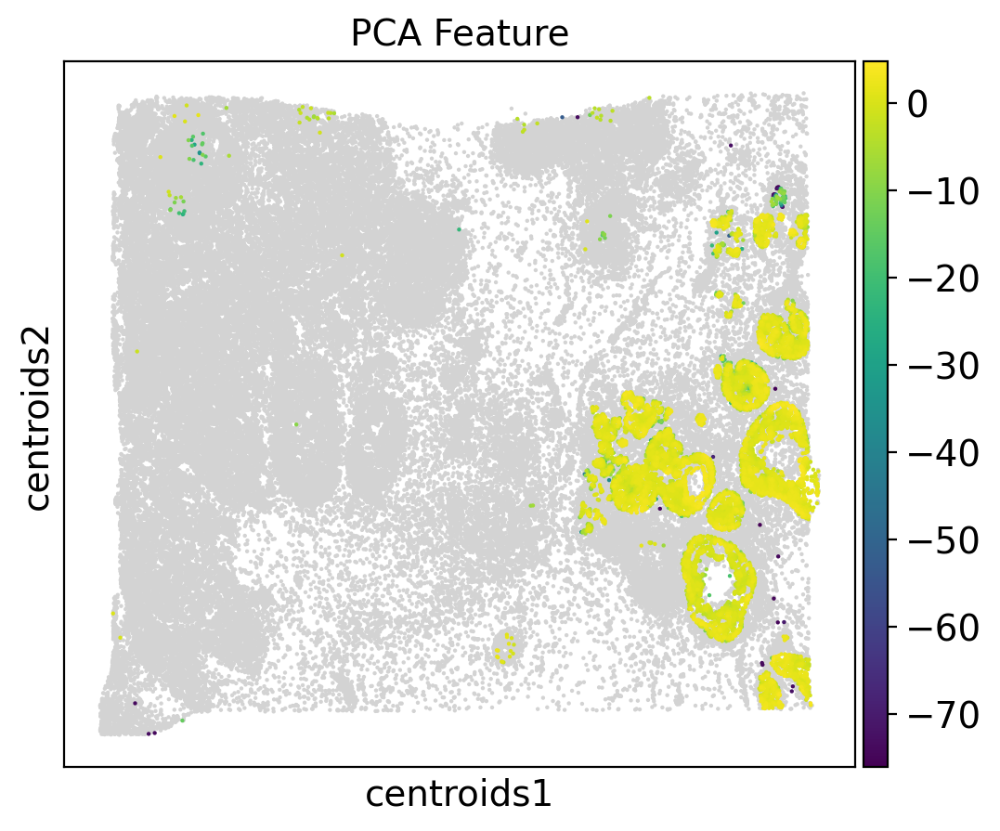

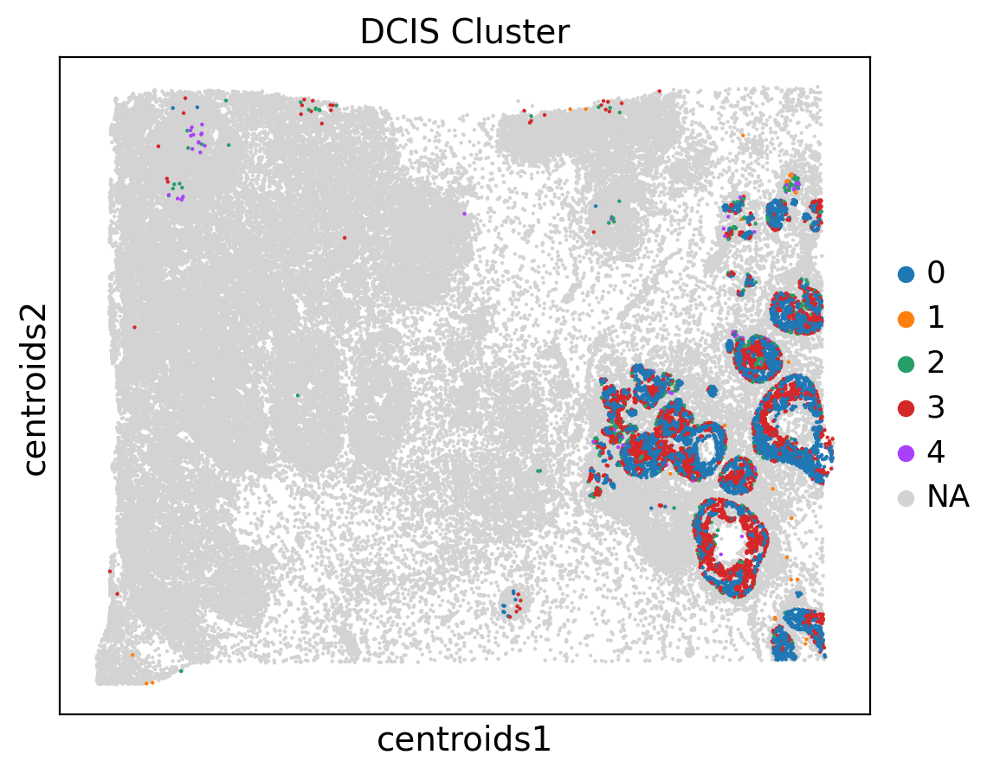

In [11]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

idx = np.arange(cell_types.shape[0])
ct_query = ['DCIS 2']
ct_key = ['Macrophages'] 

mask_query = np.zeros((idx.shape[0], ), dtype=bool)
for ct in ct_query:
    mask_query += (cell_types==ct)
mask_key = np.zeros((idx.shape[0], ), dtype=bool)
for ct in ct_key:
    mask_key += (cell_types==ct)
attn_sub = attn_matrix_plot[mask_query]
attn_sub = attn_sub[:, mask_key]

k = 5
n_pca = 100
n_pca_use = 10

pca = PCA(n_components=n_pca)
attn_pca = pca.fit_transform(attn_sub)
kmeans = KMeans(n_clusters=k, random_state=42)
dcis_clusters = kmeans.fit_predict(attn_pca[:, :n_pca_use])
dcis_clusters = dcis_clusters.astype(str)

adata_sample.obs['pca_feature'] = np.nan
adata_sample.obs.loc[mask_query, 'pca_feature'] = attn_pca[:, 0]
sc.pl.embedding(adata_sample, basis='centroids', color='pca_feature', title="PCA Feature", s=10)

adata_sample.obs['dcis_cluster'] = np.nan
adata_sample.obs.loc[mask_query, 'dcis_cluster'] = dcis_clusters
sc.settings.set_figure_params(dpi=100, figsize=(6, 5))
sc.pl.embedding(adata_sample, basis='centroids', color='dcis_cluster', title="DCIS Cluster", s=10)

# np.save('/data/wuqitian/breast/NCBI785_dcis1_cluster.npy', dcis_clusters)
# np.save('/data/wuqitian/breast/NCBI785_dcis2_cluster.npy', dcis_clusters)

<tifffile.TiffFile 'NCBI785.tif'> shaped series shape does not match page shape


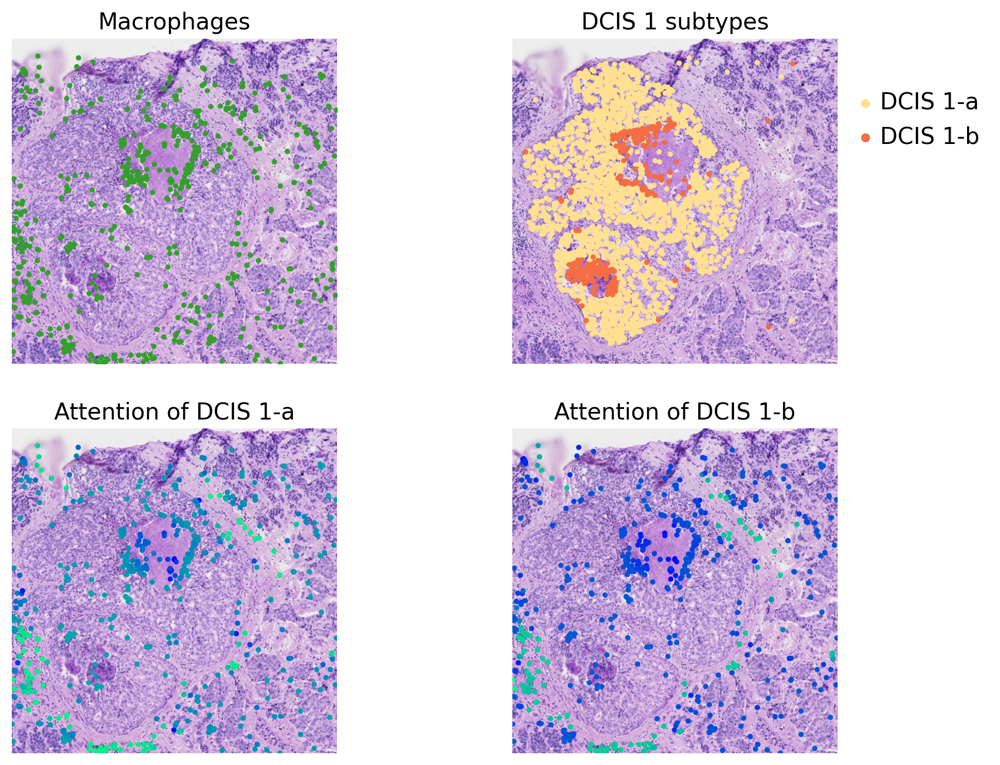

In [13]:
image_path = '/ewsc/wuqitian/hest_data/wsis/NCBI785.tif'
image = tiff.imread(image_path)

dcis1_cluster = np.load('/ewsc/wuqitian/breast/NCBI785_dcis1_cluster.npy')

centroids = adata_sample.obsm['centroids']
x, y = centroids[:, 0], centroids[:, 1]
x_min, x_max, y_min, y_max = 6800, 10800, 18000, 22000
mask_region = (x > x_min) * (x < x_max) * (y > y_min) * (y < y_max)
image_sub = image[y_min:y_max, x_min:x_max]
x_, y_ = x - x_min, y - y_min

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

ax = axes[0]
ax.imshow(image_sub)
ct_plot = ['Macrophages'] 

colors_sub = {k:colors[k] for k in ct_plot}
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    ax.scatter(x_[mask], y_[mask], s=5, c=colors[ct], label=ct)
ax.grid(False)
ax.axis('off')
ax.set_title('Macrophages')
ax.invert_yaxis()

ax = axes[1]
ax.imshow(image_sub)
ct = 'DCIS 1'

mask_region_sub = mask_region[cell_types==ct]
x_sub, y_sub = x_[cell_types==ct], y_[cell_types==ct]
huddles=[]
for i in ['0', '1', '2', '3']:
    mask = (dcis1_cluster==i) * mask_region_sub
    ax1 = ax.scatter(x_sub[mask], y_sub[mask], s=5, c='#fee090', label='DCIS 1-a')
    huddles += [ax1] if i=='0' else []
for i in ['4']:
    mask = (dcis1_cluster==i) * mask_region_sub
    ax2 = ax.scatter(x_sub[mask], y_sub[mask], s=5, c='#f46d43', label='DCIS 1-b')
    huddles += [ax2]

ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
labels = ['DCIS 1-a', 'DCIS 1-b']
ax.legend(huddles, labels, loc='upper right', bbox_to_anchor=(1.5, 0.9), markerscale=2, ncols=1, fontsize=14, frameon=False)
ax.set_title('DCIS 1 subtypes')

ax = axes[2]
ax.imshow(image_sub)
# mask = (dcis1_cluster=='3') * mask_region_sub
mask = np.sum([(dcis1_cluster==i) * mask_region_sub for i in ['0', '1', '2', '3']])
attn_dcis1a = attn_matrix_plot[cell_types=='DCIS 1'][mask]
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    attn_dcis1a_ct = attn_dcis1a[:, mask]
    attn_dcis1a_ct_mode = get_mode_estimate(attn_dcis1a_ct)
    scatter = ax.scatter(x_[mask], y_[mask], s=5, c=attn_dcis1a_ct_mode, cmap='winter')
ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
ax.set_title('Attention of DCIS 1-a')

ax = axes[3]
ax.imshow(image_sub)
mask = (dcis1_cluster=='4') * mask_region_sub
attn_dcis1b = attn_matrix_plot[cell_types=='DCIS 1'][mask]
attn_ct = attn_dcis1a.mean(axis=0)
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    attn_dcis1b_ct = attn_dcis1b[:, mask]
    attn_dcis1b_ct_mode = get_mode_estimate(attn_dcis1b_ct)
    scatter = ax.scatter(x_[mask], y_[mask], s=5, c=attn_dcis1b_ct_mode, cmap='winter')
ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
ax.set_title('Attention of DCIS 1-b')
plt.savefig('../../figure/attn_analysis_breast_dcis1_demo.pdf', dpi=100)

plt.show()

<tifffile.TiffFile 'NCBI785.tif'> shaped series shape does not match page shape


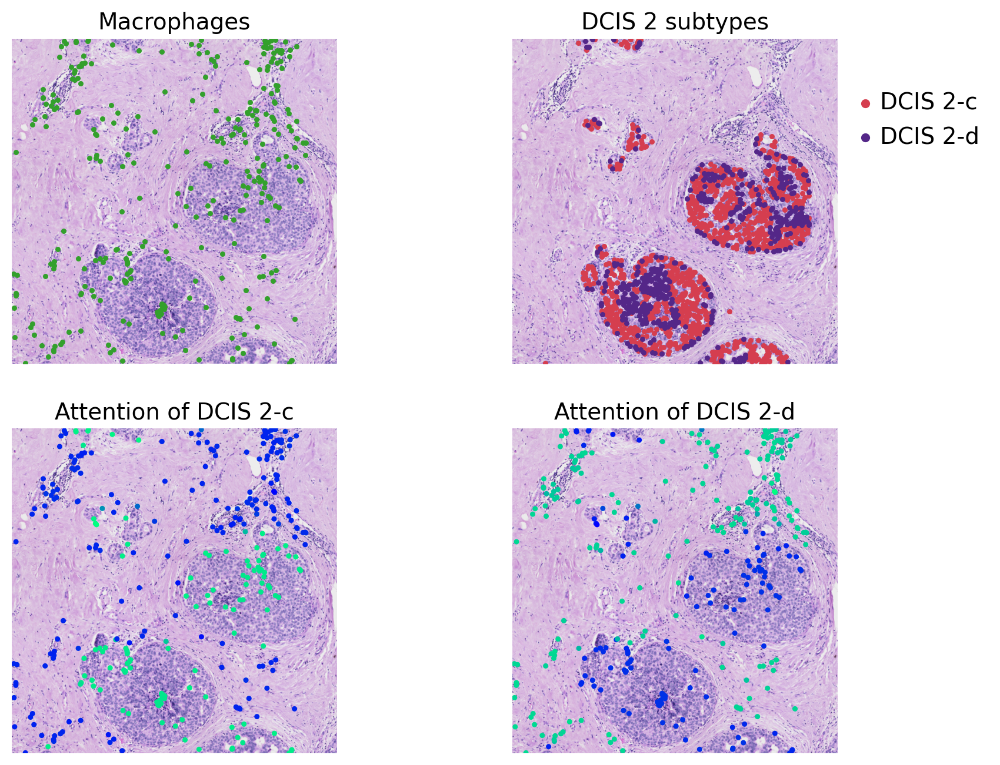

In [14]:
image_path = '/ewsc/wuqitian/hest_data/wsis/NCBI785.tif'
image = tiff.imread(image_path)

dcis2_cluster = np.load('/ewsc/wuqitian/breast/NCBI785_dcis2_cluster.npy')

centroids = adata_sample.obsm['centroids']
x, y = centroids[:, 0], centroids[:, 1]
x_min, x_max, y_min, y_max = 23000, 27000, 14000, 18000
mask_region = (x > x_min) * (x < x_max) * (y > y_min) * (y < y_max)
image_sub = image[y_min:y_max, x_min:x_max]
x_, y_ = x - x_min, y - y_min

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

ax = axes[0]
ax.imshow(image_sub)
ct_plot = ['Macrophages'] 

colors_sub = {k:colors[k] for k in ct_plot}
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    ax.scatter(x_[mask], y_[mask], s=5, c=colors[ct], label=ct)
ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
ax.set_title('Macrophages')

ax = axes[1]
ax.imshow(image_sub)
ct = 'DCIS 2'
mask_region_sub = mask_region[cell_types==ct]
x_sub, y_sub = x_[cell_types==ct], y_[cell_types==ct]
huddles = []
for i in ['0', '1', '2', '4']:
    mask = (dcis2_cluster==i) * mask_region_sub
    ax1 = ax.scatter(x_sub[mask], y_sub[mask], s=5, c='#d53e4f', label='DCIS 2-c')
    huddles += [ax1] if i=='0' else []
for i in ['3']:
    mask = (dcis2_cluster==i) * mask_region_sub
    ax2 = ax.scatter(x_sub[mask], y_sub[mask], s=5, c='#542788', label='DCIS 2-d')
    huddles += [ax2]

ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
labels = ['DCIS 2-c', 'DCIS 2-d']
ax.legend(huddles, labels, loc='upper right', bbox_to_anchor=(1.5, 0.9), markerscale=2, ncols=1, fontsize=14, frameon=False)
ax.set_title('DCIS 2 subtypes')

ax = axes[2]
ax.imshow(image_sub)
# mask = (dcis2_cluster=='1') * mask_region_sub
mask = np.sum([(dcis1_cluster==i) * mask_region_sub for i in ['0', '1', '2', '4']])
attn_dcis2c = attn_matrix_plot[cell_types=='DCIS 2'][mask]
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    attn_dcis2c_ct = attn_dcis2c[:, mask]
    attn_dcis2c_ct_mode = get_mode_estimate(attn_dcis2c_ct)
    scatter = ax.scatter(x_[mask], y_[mask], s=5, c=attn_dcis2c_ct_mode, cmap='winter')
ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
ax.set_title('Attention of DCIS 2-c')

ax = axes[3]
ax.imshow(image_sub)
mask = (dcis2_cluster=='3') * mask_region_sub
attn_dcis2d = attn_matrix_plot[cell_types=='DCIS 2'][mask]
for ct in colors_sub.keys():
    mask = (cell_types==ct) * mask_region
    attn_dcis2d_ct = attn_dcis2d[:, mask]
    attn_dcis2d_ct_mode = get_mode_estimate(attn_dcis2d_ct)
    scatter = ax.scatter(x_[mask], y_[mask], s=5, c=attn_dcis2d_ct_mode, cmap='winter')
ax.grid(False)
ax.axis('off')
ax.invert_yaxis()
ax.set_title('Attention of DCIS 2-d')
plt.savefig('../../figure/attn_analysis_breast_dcis2_demo.pdf', dpi=100)

plt.show()

<tifffile.TiffFile 'NCBI785.tif'> shaped series shape does not match page shape


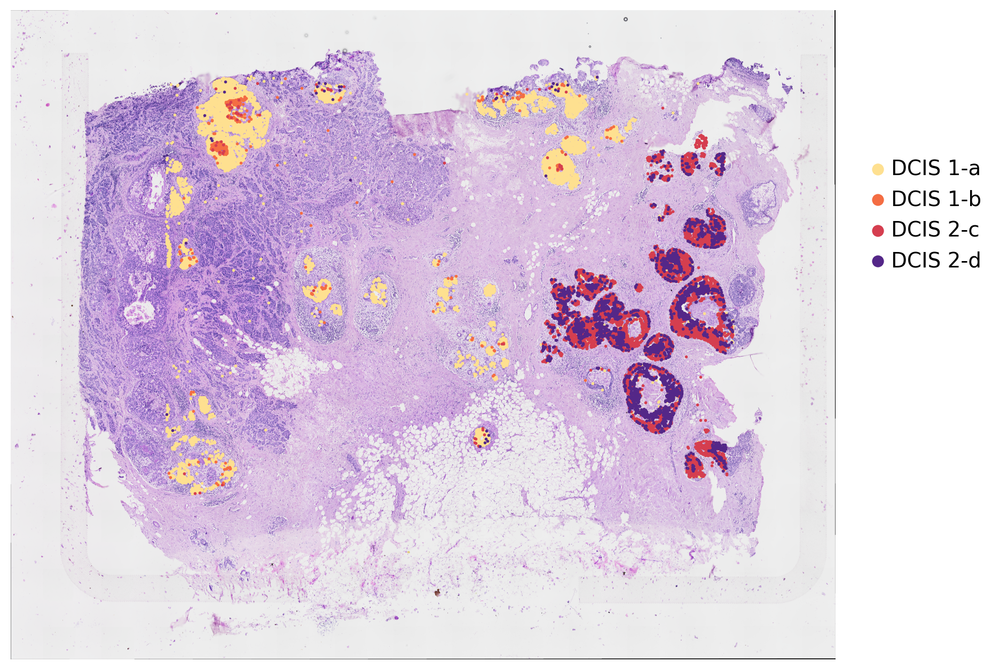

In [15]:
dcis1_cluster = np.load('/ewsc/wuqitian/breast/NCBI785_dcis1_cluster.npy')
dcis2_cluster = np.load('/ewsc/wuqitian/breast/NCBI785_dcis2_cluster.npy')

image_path = '/ewsc/wuqitian/hest_data/wsis/NCBI785.tif'
image = tiff.imread(image_path)
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(image)
plt.gca().invert_yaxis()

centroids = adata_sample.obsm['centroids']
x, y = centroids[:, 0], centroids[:, 1]
labels = ['DCIS 1-a', 'DCIS 1-b', 'DCIS 2-c', 'DCIS 2-d']

ct = 'DCIS 1'
ct_mask = (cell_types==ct)
x_sub, y_sub = x[ct_mask], y[ct_mask]
huddles = []
for i in ['0', '1', '2', '3']:
    mask = (dcis1_cluster==i)
    ax1 = ax.scatter(x_sub[mask], y_sub[mask], s=1, c='#fee090', label='DCIS 1-a')
    if i=='0':
        huddles.append(ax1)
for i in ['4']:
    mask = (dcis1_cluster==i)
    ax2 = ax.scatter(x_sub[mask], y_sub[mask], s=1, c='#f46d43', label='DCIS 1-b')
    huddles.append(ax2)

ct = 'DCIS 2'
ct_mask = (cell_types==ct)
x_sub, y_sub = x[ct_mask], y[ct_mask]
for i in ['0', '1', '2', '4']:
    mask = (dcis2_cluster==i)
    ax4 = ax.scatter(x_sub[mask], y_sub[mask], s=1, c='#d53e4f', label='DCIS 2-c')
    if i=='0':
        huddles.append(ax4)
for i in ['3']:
    mask = (dcis2_cluster==i) 
    ax3 = ax.scatter(x_sub[mask], y_sub[mask], s=1, c='#542788', label='DCIS 2-d')
    huddles.append(ax3)

ax.grid(False)
ax.axis('off')
ax.legend(huddles, labels, loc='upper right', bbox_to_anchor=(1.2, 0.8), markerscale=7, ncols=1, fontsize=14, frameon=False)
plt.savefig('../../figure/attn_analysis_breast_dcis_cluster.pdf', dpi=100)
plt.show()

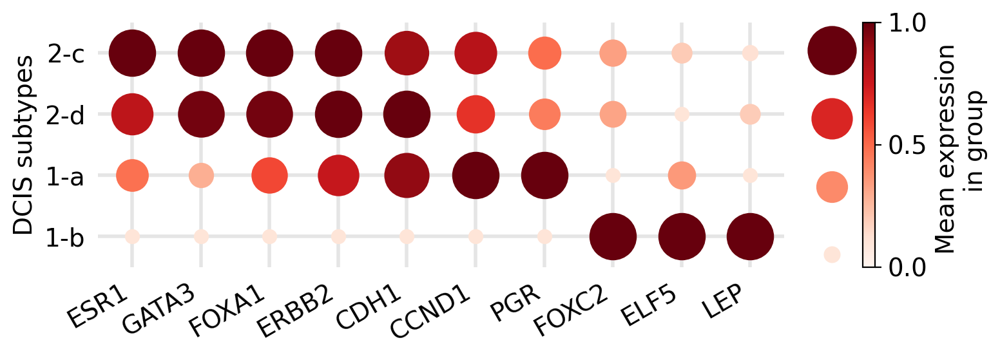

In [17]:
# tumor-immune attention

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap

gene_mean = [[0., 0., 0., 0., 0., 0., 0., 1., 1., 1.],
             [0.41995835, 0.2067758, 0.54431104, 0.74332482, 0.90111733, 1., 1., 0., 0.28194262, 0.],
 [0.77046336, 0.97132892, 0.97079742, 0.99956953, 1., 0.61869107, 0.38348663, 0.24693857, 0., 0.10423094],
 [1., 1., 1., 1., 0.87268691, 0.79207542, 0.433616, 0.25899902, 0.10734133, 0.02120094]]
cluster_labels = ['1-b', '1-a', '2-d', '2-c']
gene_labels = ['ESR1', 'GATA3', "FOXA1", 'ERBB2', 'CDH1', 'CCND1', 'PGR', 'FOXC2', 'ELF5', 'LEP']

data = np.array(gene_mean)
x_labels, y_labels = gene_labels, cluster_labels

fig, ax = plt.subplots(figsize=(8, 3))

norm = mcolors.Normalize(vmin=data.min(), vmax=data.max())
cmap = cm.Reds

for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        x_ij = data[i, j]
        plt.scatter(
            x=j+1,
            y=i+1,
            s=(x_ij*0.9+0.1) * 700,
            c=cmap(norm(x_ij)*0.9+0.1), 
            linewidths=0.
        )

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', which='both', top=False, left=False, right=False, bottom=False) 
ax.set_xticks(np.arange(1, len(x_labels)+1), x_labels, rotation=30, ha='right')
ax.set_yticks(np.arange(1, len(y_labels)+1))
ax.set_xticklabels(x_labels, fontsize=14)
ax.set_yticklabels(y_labels, fontsize=14)
ax.set_xlim([0.5, len(x_labels)+0.5])
ax.set_ylim([0.5, len(y_labels)+0.5])
ax.set_ylabel('DCIS subtypes', fontsize=14)
ax.set_axisbelow(True) 
ax.grid(True, linestyle='-', linewidth=2.0, alpha=0.5)

sm = cm.ScalarMappable(cmap=cmap)
sm.set_array([]) 
cbar = plt.colorbar(sm, ax=ax, fraction=0.025, pad=0.1)
cbar.set_ticks([0.0, 0.5, 1.0])
cbar.set_label('Mean expression \n in group', fontsize=14)

for size in [1, 0.7, 0.4, 0.1]: 
    ax.scatter([], [], s=size*700, color=cmap(norm(size)), label=' ')

legend = ax.legend(title='', labelspacing=2, loc='center left',
                   bbox_to_anchor=(1.03, 0.47), frameon=False)
legend.get_title().set_fontsize('14')

plt.tight_layout()
plt.savefig('../../figure/attn_analysis_breast_dcis_de_mean.pdf', dpi=100)
plt.show()

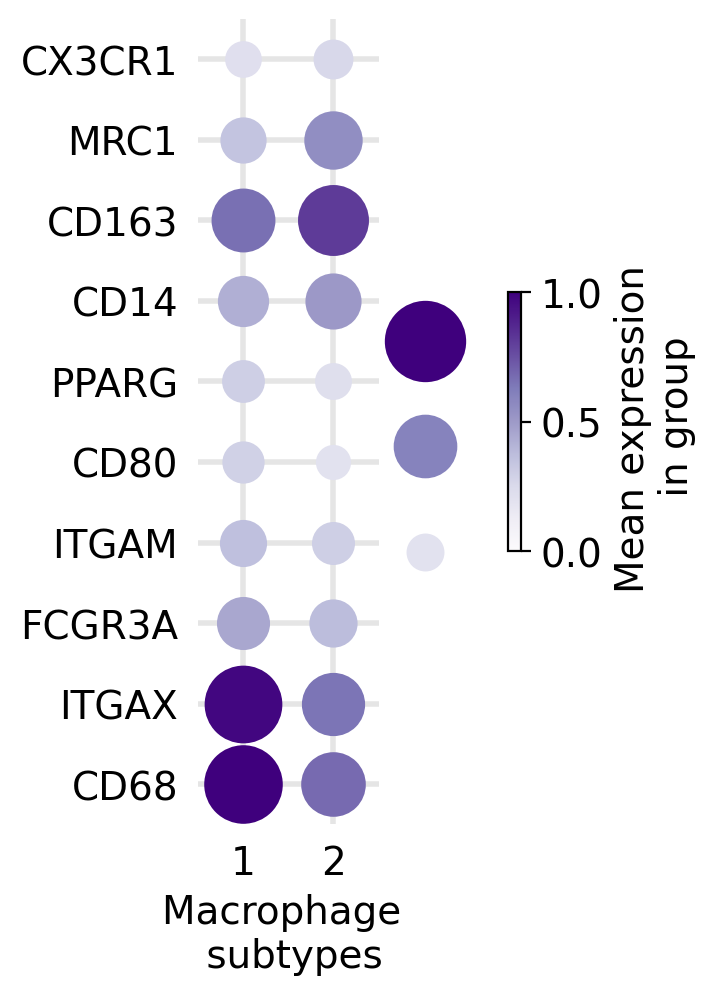

In [18]:
# DCIS 1 macrophage subtypes

gene_mean = [[1.43793103, 1.4, 0.4862069, 0.31724138, 0.19310345, 0.20689655, 0.43103448, 0.84482759, 0.29310345, 0.06896552, 0.02068966],
            [0.87096774, 0.8202765, 0.34562212, 0.21198157, 0.03686636, 0.07373272, 0.58064516, 1.11520737, 0.65437788, 0.13824885, 0.07834101]]
cluster_labels = ['1', '2']
gene_labels = [
    # Cluster 1
    "CD68",     
    "ITGAX",    
    "FCGR3A",   
    "ITGAM",   
    "CD80",      
    "PPARG",     
    # Cluster 2
    "CD14",     
    "CD163",    
    "MRC1",     
    "CX3CR1",   
    "SLAMF1"   
]

data = np.array(gene_mean)
x_labels, y_labels = gene_labels, cluster_labels

data = data[:, :-1]
x_labels = x_labels[:-1]
data = (data - np.min(data)) / (np.max(data) - np.min(data))

fig, ax = plt.subplots(figsize=(3.8, 5.2))

norm = mcolors.Normalize(vmin=data.min(), vmax=data.max())
cmap = cm.Purples

for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        x_ij = data[i, j]
        plt.scatter(
            x=i+1,
            y=j+1,
            s=(x_ij*0.8+0.2) * 800,  
            c=cmap(x_ij*0.8+0.2),  
            linewidths=0.
        )

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', which='both', top=False, left=False, right=False, bottom=False) 
ax.set_yticks(np.arange(1, len(x_labels)+1), x_labels, rotation=0, ha='right')
ax.set_xticks(np.arange(1, len(y_labels)+1))
ax.set_yticklabels(x_labels, fontsize=14)
ax.set_xticklabels(y_labels, fontsize=14)
ax.set_ylim([0.5, len(x_labels)+0.5])
ax.set_xlim([0.5, len(y_labels)+0.5])
ax.set_xlabel('Macrophage \n subtypes', fontsize=14)
ax.set_axisbelow(True) 
ax.grid(True, linestyle='-', linewidth=2.0, alpha=0.5)

sm = cm.ScalarMappable(cmap=cmap)
sm.set_array([]) 
cbar = plt.colorbar(sm, ax=ax, fraction=0.04, pad=0.4)
cbar.set_ticks([0.0, 0.5, 1.0])
cbar.set_label('Mean expression \n in group', fontsize=14)

for size in [1, 0.6, 0.2]:  
    ax.scatter([], [], s=size*800, color=cmap(norm(size)), label=' ')

legend = ax.legend(title='', labelspacing=2, loc='center left',
                   bbox_to_anchor=(1.03, 0.47), frameon=False)
legend.get_title().set_fontsize('14')

plt.tight_layout()
plt.savefig('../../figure/attn_analysis_breast_dcis1_macro_de_mean.pdf', dpi=100)
plt.show()

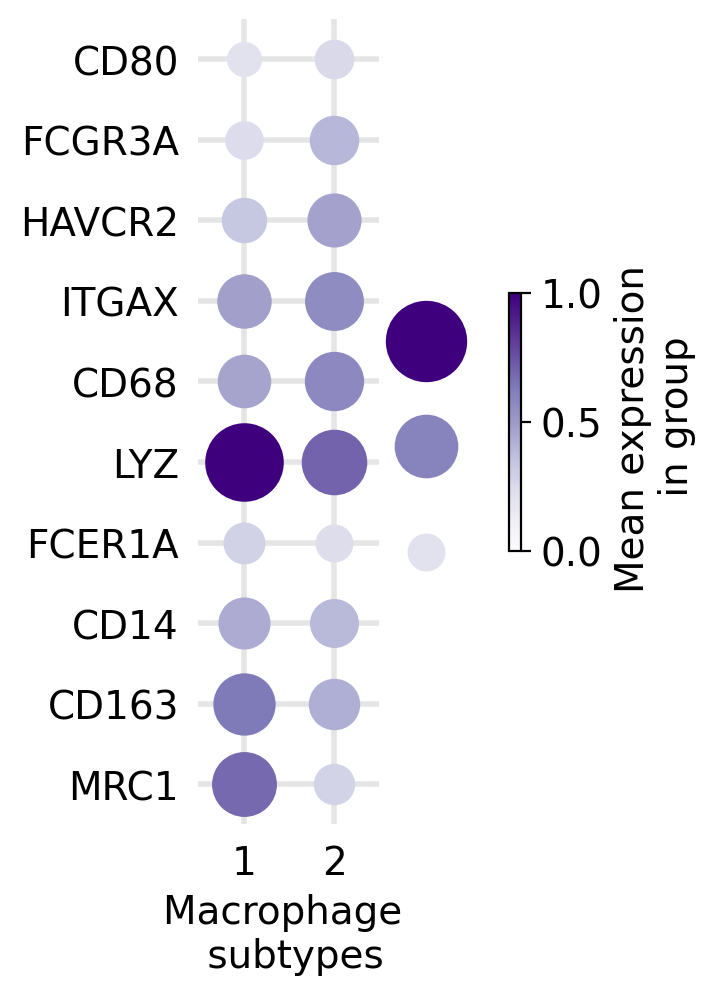

In [19]:
# DCIS 2 macrophage subtypes

gene_mean = [[1.74299065, 1.55607477, 0.87850467, 0.32242991, 2.88317757, 2.00934579, 0.96728972, 1.02336449, 0.5, 0.1682243, 0.12616822, 0.01869159],
            [0.29591837, 0.83673469, 0.69387755, 0.13265306, 1.79591837, 1.83673469, 1.34693878, 1.31632653, 1., 0.7244898, 0.60204082, 0.21428571]]
cluster_labels = ['1', '2']
gene_labels = [
    # Cluster 1
    "MRC1",      
    "CD163",     
    "CD14",      
    "FCER1A",    
    "LYZ",      
    "FGL2",     

    # Cluster 2
    "CD68",      
    "ITGAX",     
    "HAVCR2",    
    "FCGR3A",   
    "CD83",     
    "CD80",     
]

data = np.array(gene_mean)
x_labels, y_labels = gene_labels, cluster_labels

gene_idx = [0, 1, 2, 3, 4, 6, 7, 8, 9, 11]
data = data[:, np.array(gene_idx)]
x_labels = [x_labels[idx] for idx in gene_idx]
data = (data - np.min(data)) / (np.max(data) - np.min(data))

fig, ax = plt.subplots(figsize=(3.8, 5.2))

norm = mcolors.Normalize(vmin=data.min(), vmax=data.max())
cmap = cm.Purples

for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        x_ij = data[i, j]
        plt.scatter(
            x=i+1,
            y=j+1,
            s=(x_ij*0.8+0.2) * 800,  
            c=cmap(x_ij*0.8+0.2),  
            linewidths=0.
        )

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis='both', which='both', top=False, left=False, right=False, bottom=False) 
ax.set_yticks(np.arange(1, len(x_labels)+1), x_labels, rotation=0, ha='right')
ax.set_xticks(np.arange(1, len(y_labels)+1))
ax.set_yticklabels(x_labels, fontsize=14)
ax.set_xticklabels(y_labels, fontsize=14)
ax.set_ylim([0.5, len(x_labels)+0.5])
ax.set_xlim([0.5, len(y_labels)+0.5])
ax.set_xlabel('Macrophage \n subtypes', fontsize=14)
ax.set_axisbelow(True) 
ax.grid(True, linestyle='-', linewidth=2.0, alpha=0.5)

sm = cm.ScalarMappable(cmap=cmap)
sm.set_array([]) 
cbar = plt.colorbar(sm, ax=ax, fraction=0.04, pad=0.4)
cbar.set_ticks([0.0, 0.5, 1.0])
cbar.set_label('Mean expression \n in group', fontsize=14)

for size in [1, 0.6, 0.2]:  
    ax.scatter([], [], s=size*800, color=cmap(norm(size)), label=' ')

legend = ax.legend(title='', labelspacing=2, loc='center left',
                   bbox_to_anchor=(1.03, 0.47), frameon=False)
legend.get_title().set_fontsize('14')

plt.tight_layout()
plt.savefig('../../figure/attn_analysis_breast_dcis2_macro_de_mean.pdf', dpi=100)
plt.show()